In [1]:
pip install --upgrade nbformat


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# BASE

import numpy as np
import pandas as pd
import os
import gc
import warnings

# DATA VISUALIZATION

import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import plotly.express as px
from sklearn.metrics import mean_squared_error
from math import sqrt
import statsmodels
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import OneHotEncoder
import itertools
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.plot import plot_yearly
from prophet.plot import add_changepoints_to_plot
from prophet.diagnostics import cross_validation, performance_metrics
from prophet import Prophet
import plotly.graph_objs as go
import plotly.express as px

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Holiday and events

In [3]:
# Load the dataset
hol_df = pd.read_csv('https://raw.githubusercontent.com/mtzeve/Store_Forecast/main/holidays_events.csv')
oil_df = pd.read_csv('https://raw.githubusercontent.com/mtzeve/Store_Forecast/main/oil.csv')
stores_df = pd.read_csv('https://raw.githubusercontent.com/mtzeve/Store_Forecast/main/stores.csv')
test_df = pd.read_csv('https://raw.githubusercontent.com/mtzeve/Store_Forecast/main/test.csv')
train_df = pd.read_csv('https://media.githubusercontent.com/media/mtzeve/Store_Forecast/main/train.csv')
trans_df = pd.read_csv('https://raw.githubusercontent.com/mtzeve/Store_Forecast/main/transactions.csv')





Basically what we are going to do is try to reduce the categories of holidays type to 3: we are gonna have holidays, events, normal days (added).

There are 54 stores and 33 prodcut families in the data. The time serie starts from 2013-01-01 and finishes in 2017-08-31. However, you know that Kaggle gives us splitted two data as train and test. The dates in the test data are for the 15 days after the last date in the training data. Date range in the test data will be very important to us while we are defining a cross-validation strategy and creating new features.

There are 6 data that we will study on them step by step.

Train
Test
Store
Transactions
Holidays and Events
Daily Oil Price
The train data contains time series of the stores and the product families combination.

The sales column gives the total sales for a product family at a particular store at a given date. Fractional values are possible since products can be sold in fractional units (1.5 kg of cheese, for instance, as opposed to 1 bag of chips).The onpromotion column gives the total number of items in a product family that were being promoted at a store at a given date.

Stores data gives some information about stores such as city, state, type, cluster.

Transaction data is highly correlated with train's sales column. You can understand the sales patterns of the stores.

Holidays and events data is a meta data. This data is quite valuable to understand past sales, trend and seasonality components. However, it needs to be arranged. You are going to find a comprehensive data manipulation for this data. That part will be one of the most important chapter in this notebook.

Daily Oil Price data is another data which will help us. Ecuador is an oil-dependent country and it's economical health is highly vulnerable to shocks in oil prices. That's why, it will help us to understand which product families affected in positive or negative way by oil price.

"Additional Notes"

Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this.


A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

In [4]:
# Datetime
train_df["date"] = pd.to_datetime(train_df.date)
test_df["date"] = pd.to_datetime(test_df.date)
trans_df["date"] = pd.to_datetime(trans_df.date)

# Data types
train_df.onpromotion = train_df.onpromotion.astype("float16")
train_df.sales = train_df.sales.astype("float32")
stores_df.cluster = stores_df.cluster.astype("int8")

In [5]:
train_df.head(10)

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0.0
4,4,2013-01-01,1,BOOKS,0.0,0.0
5,5,2013-01-01,1,BREAD/BAKERY,0.0,0.0
6,6,2013-01-01,1,CELEBRATION,0.0,0.0
7,7,2013-01-01,1,CLEANING,0.0,0.0
8,8,2013-01-01,1,DAIRY,0.0,0.0
9,9,2013-01-01,1,DELI,0.0,0.0


Transactions

In [6]:
trans_df.head(10)

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
5,2013-01-02,5,1903
6,2013-01-02,6,2143
7,2013-01-02,7,1874
8,2013-01-02,8,3250
9,2013-01-02,9,2940


In [7]:
trans_df.isnull().sum()

date            0
store_nbr       0
transactions    0
dtype: int64

In [8]:
trans_df['store_nbr'].nunique()

54

In [9]:
#we want to look at the how the transactions and train data is related to each other.
#aggregating the transactions column by each date and taking the sum
trans_grouped = trans_df.groupby('date')['transactions'].sum()

In [10]:
#this creates a dataframe temp which is a created by joining train_df and trans_df. train_df is aggreagated by date and store number and has the sum of sales.
temp = pd.merge(train_df.groupby(["date", "store_nbr"]).sales.sum().reset_index(), trans_df, how = "left")

In [11]:
#this allows us to plot a scatterplot of daily transactions and trains data
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

there is a highly correlation between total sales and transactions. This validates that data are ok on aggregate level. So for our next step we will look into whether oil prices has any relationship with total transaction or not. if not then we can say that it will probably not have any effect on train set as well

**Oil Price**

In [12]:
oil_df["date"] = pd.to_datetime(oil_df.date)

In [13]:
oil_df.shape

(1218, 2)

In [14]:
# resample the time series data to a daily frequency, sum up the values for each day => DataFrame with daily aggregated values
oil_df = oil_df.set_index("date").dcoilwtico.resample("D").sum().reset_index()

# Linear Interpolation is suitable for this time serie. we can see the trend and predict missing data points, when we look at a time serie plot of oil price.
oil_df["dcoilwtico"] = np.where(oil_df["dcoilwtico"] == 0, np.nan, oil_df["dcoilwtico"])
oil_df["dcoilwtico_interpolated"] =oil_df.dcoilwtico.interpolate().round(2)
# The first row of interpolated column wasn't filled so thats why i did it with backfill
oil_df["dcoilwtico_interpolated"].fillna(method='bfill', inplace=True)

C:\Users\Dell\AppData\Local\Temp\ipykernel_20116\2605791012.py:8: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [15]:
oil_df.head(10)

,date,dcoilwtico,dcoilwtico_interpolated
0,2013-01-01,NaN,93.14
1,2013-01-02,93.14,93.14
2,2013-01-03,92.97,92.97
3,2013-01-04,93.12,93.12
4,2013-01-05,NaN,93.15
5,2013-01-06,NaN,93.17
6,2013-01-07,93.20,93.20
7,2013-01-08,93.21,93.21
8,2013-01-09,93.08,93.08
9,2013-01-10,93.81,93.81


In [16]:
# Check if i have NAN in the interpolated column

oil_df.isnull().sum()

date                         0
dcoilwtico                 529
dcoilwtico_interpolated      0
dtype: int64

In [17]:
# i want to visualise this

In [18]:
oil_grouped = oil_df.groupby('date')['dcoilwtico_interpolated'].sum()

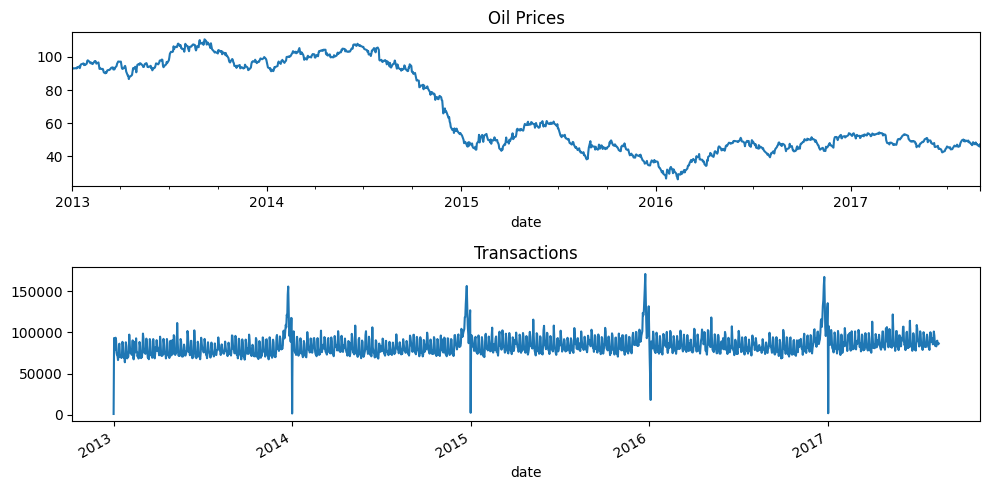

In [19]:
fig, axs = plt.subplots(2, 1, figsize=(10, 5))

# Plot for oil_grouped
oil_grouped.plot(y='dcoilwtico_interpolated', ax=axs[0])
axs[0].set_title('Oil Prices')

# Plot for trans_grouped
trans_grouped.plot(y='transactions', ax=axs[1])
axs[1].set_title('Transactions')

plt.tight_layout()
plt.show()

Holidays cleanup


In [20]:
#converts the hol_df date colummn to date type
hol_df["date"] = pd.to_datetime(hol_df.date)

In [21]:
hol_df.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [22]:
# Transferred Holidays
#Filters the DataFrame hol_df to get rows where type is "Holiday" and transferred is True. Then, it drops the "transferred" column, resets the index, and stores the result in tr1
tr1 = hol_df[(hol_df.type == "Holiday") & (hol_df.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)

#Filters hol_df to get rows where type is "Transfer", drops the "transferred" column, and resets the index, storing the result in tr2.
tr2 = hol_df[(hol_df.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)

#Concatenates tr1 and tr2 along axis=1 (column-wise), but then it selects specific columns using iloc and reorders them.
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]
tr

,date,type,locale,locale_name,description
0,2012-10-12,Holiday,National,Ecuador,Independencia de Guayaquil
1,2013-10-11,Holiday,National,Ecuador,Independencia de Guayaquil
2,2014-10-10,Holiday,National,Ecuador,Independencia de Guayaquil
3,2016-05-27,Holiday,National,Ecuador,Batalla de Pichincha
4,2016-07-24,Holiday,Local,Guayaquil,Fundacion de Guayaquil
5,2016-08-12,Holiday,National,Ecuador,Primer Grito de Independencia
6,2017-01-02,Holiday,National,Ecuador,Primer dia del ano
7,2017-04-13,Holiday,Local,Cuenca,Fundacion de Cuenca
8,2017-05-26,Holiday,National,Ecuador,Batalla de Pichincha
9,2017-08-11,Holiday,National,Ecuador,Primer Grito de Independencia


In [23]:
# It filters rows where transferred is False and type is not equal to "Transfer". It then drops the "transferred" column from the DataFrame.
hol_df = hol_df[(hol_df.transferred == False) & (hol_df.type != "Transfer")].drop("transferred", axis = 1)

#After the initial filtering, it appends the DataFrame tr (which was created in the previous code snippet) to hol_df.
hol_df = pd.concat([hol_df, tr]).reset_index(drop=True)

hol_df

,date,type,locale,locale_name,description
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba
...,...,...,...,...,...
333,2017-04-13,Holiday,Local,Cuenca,Fundacion de Cuenca
334,2017-05-26,Holiday,National,Ecuador,Batalla de Pichincha
335,2017-08-11,Holiday,National,Ecuador,Primer Grito de Independencia
336,2017-09-29,Holiday,Local,Ibarra,Fundacion de Ibarra


In [24]:
# We have some numbers and weird symbols in description column, im gonna get rid of them
hol_df[hol_df['type'] == 'Additional'].head()

,date,type,locale,locale_name,description
26,2012-12-05,Additional,Local,Quito,Fundacion de Quito-1
29,2012-12-21,Additional,National,Ecuador,Navidad-4
31,2012-12-22,Additional,National,Ecuador,Navidad-3
32,2012-12-23,Additional,National,Ecuador,Navidad-2
34,2012-12-24,Additional,National,Ecuador,Navidad-1


In [25]:
# Additional Holidays
hol_df["description"] = hol_df["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', "")
# Converting Additional to Holiday "type"
hol_df["type"] = np.where(hol_df["type"] == "Additional", "Holiday", hol_df["type"])

In [26]:
# Bridge Holidays

# Puente in Spannish means Bridge, so im replacing the description

hol_df["description"] = hol_df["description"].str.replace("Puente ", "")

# If the condition is met (i.e., the "type" is "Bridge"), it replaces that value with "Holiday". Otherwise, it keeps the original value.
hol_df["type"] = np.where(hol_df["type"] == "Bridge", "Holiday", hol_df["type"])

In [27]:
# Work Day Holidays, that is meant to payback the Bridge.

work_day = hol_df[hol_df.type == "Work Day"]
hol_df = hol_df[hol_df.type != "Work Day"]

In [28]:
hol_df.head()

,date,type,locale,locale_name,description
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba


In [29]:
#hol_df[hol_df.type == "Event"].nunique()

In [30]:
# Split

# Events are national, so im droping type locale, locale name, change descr to events too

#events = hol_df[hol_df.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

In [31]:
#events.head()

In [32]:
hol_df.head()

,date,type,locale,locale_name,description
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba


In [33]:
#After this line executes, hol_df will contain only the rows where 'locale' is "National", and the columns 'type', 'locale_name', and 'locale' will have been removed from the DataFrame.
hol_df = hol_df[hol_df['locale'] == "National"].drop(['type', 'locale_name', 'locale'], axis=1)

#Cleaning up where locale == Regional, National and local and droping duplicates
#regional = hol_df[hol_df.locale == "Regional"].rename({"locale_name":"state", "locale" : "holiday_regional"}, axis = 1).drop("description", axis = 1).drop_duplicates()
#national = hol_df[hol_df.locale == "National"].rename({"locale" : "holiday_national"}, axis = 1).drop(["description", "locale_name"], axis = 1).drop_duplicates()
#local = hol_df[hol_df.locale == "Local"].rename({"locale" : "holiday_local", "locale_name":"city"}, axis = 1).drop("description", axis = 1).drop_duplicates()

In [34]:
hol_df.head()

,date,description
14,2012-08-10,Primer Grito de Independencia
19,2012-11-02,Dia de Difuntos
20,2012-11-03,Independencia de Cuenca
29,2012-12-21,Navidad4
31,2012-12-22,Navidad3


In [35]:
#the columns "date" and "description" in hol_df will be renamed to "ds" and "holiday", respectively. This is a common operation when you want to make column names more intuitive or suitable for further analysis
hol_df.rename(columns={"date": "ds", "description": "holiday"}, inplace = True)

relationship between onpromotion and sales

In [36]:
#the columns 'onpromotion' and 'sales' are passed as a list within the groupby function to perform the sum aggregation for each unique date.
t1 = train_df.groupby('date')[['onpromotion', 'sales']].sum()

In [37]:
t1.head()

,onpromotion,sales
date,,
2013-01-01,0.0,2511.618896
2013-01-02,0.0,496092.406250
2013-01-03,0.0,361461.218750
2013-01-04,0.0,354459.687500
2013-01-05,0.0,477350.125000


In [38]:
#The code attempts to generate a scatter plot showing the relationship between 'onpromotion' and 'sales' columns,
px.scatter(t1, x = "onpromotion", y = "sales", trendline = "ols", trendline_color_override = "red")

adding store information to train and test

In [39]:
train_df.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0.0
4,4,2013-01-01,1,BOOKS,0.0,0.0


In [40]:
stores_df.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [41]:
#DataFrame trains_df2 will contain the columns from both train_df and stores_df, merged together based on the 'store_nbr' column, following the rules of a left join.
trains_df2 = pd.merge(train_df, stores_df, on='store_nbr', how='left')


In [42]:
#DataFrame test_df2 will contain the columns from both test_df and stores_df, merged together based on the 'store_nbr' column, following the rules of a left join.
test_df2 = pd.merge(test_df, stores_df, on='store_nbr', how='left')

In [43]:
trains_df2.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,Quito,Pichincha,D,13
1,1,2013-01-01,1,BABY CARE,0.0,0.0,Quito,Pichincha,D,13
2,2,2013-01-01,1,BEAUTY,0.0,0.0,Quito,Pichincha,D,13
3,3,2013-01-01,1,BEVERAGES,0.0,0.0,Quito,Pichincha,D,13
4,4,2013-01-01,1,BOOKS,0.0,0.0,Quito,Pichincha,D,13


In [44]:
#promotion_by_family = px.bar(trains_df2, x='onpromotion', y='family', orientation='h',
#             labels={'no_of_products_on_promotion': 'No. of Products on Promotion', 'product_family': 'Product Family'},
#             title='Number of Products on Promotion per Product Family')
#
#promotion_by_family.show()

In [45]:
# Assuming my_dataframe is our DataFrame with the columns mentioned
#filtered_data = dynamic_slice(trains_df2,
                           #   store_nbr='1',
                           #   family='AUTOMOTIVE',
                           #   onpromotion='0.0',
                           #   city='Quito',
                           #   state='Pichincha',
                           #   type='D',
                           #   cluster='3')


In [46]:
#filter function for train
def filter_dataframe1(dataframe, criteria):
    filtered_df1 = trains_df2.copy()  # Create a copy of the original DataFrame

    for column, value in criteria.items():
        filtered_df1 = filtered_df1[filtered_df1[column] == value]

    return filtered_df1

#filter function for test
def filter_dataframe(dataframe, criteria):
    filtered_df = test_df2.copy()  # Create a copy of the original DataFrame

    for column, value in criteria.items():
        filtered_df = filtered_df[filtered_df[column] == value]

    return filtered_df

In [47]:
trains_df2['family'].unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [48]:
# Example usage:
# Assuming our DataFrame is named 'df'

# Dictionary containing the filter criteria
filter_criteria = {
    'store_nbr': 1,
    'family': 'DAIRY',
    #'onpromotion': 0.0,
    #'city': 'Quito',
    #'state': 'Pichincha',
    #'type': 'D',
}

# Filter the DataFrame using the specified criteria
filtered_train = filter_dataframe1(trains_df2, filter_criteria)
filtered_test = filter_dataframe(test_df2, filter_criteria)

In [49]:
#we want to have it as an input so that the user can use their budget for promotions and see their forecasted results
no_of_promotions = 8

In [50]:
filtered_train.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster
8,8,2013-01-01,1,DAIRY,0.0,0.0,Quito,Pichincha,D,13
1790,1790,2013-01-02,1,DAIRY,579.0,0.0,Quito,Pichincha,D,13
3572,3572,2013-01-03,1,DAIRY,453.0,0.0,Quito,Pichincha,D,13
5354,5354,2013-01-04,1,DAIRY,460.0,0.0,Quito,Pichincha,D,13
7136,7136,2013-01-05,1,DAIRY,464.0,0.0,Quito,Pichincha,D,13


In [51]:
#The resulting DataFrame df will contain columns 'date', 'sales', and 'onpromotion', where the values in the 'sales' and 'onpromotion' columns are aggregated (summed) for each unique date.
df = filtered_train.groupby(['date'])[['sales','onpromotion']].sum().reset_index()
# Prophet-friendly format
df.rename(columns={"date": "ds", "sales": "y"}, inplace = True)


In [82]:
df.head()

,ds,y,onpromotion
0,2013-01-01,0.0,0.0
1,2013-01-02,579.0,0.0
2,2013-01-03,453.0,0.0
3,2013-01-04,460.0,0.0
4,2013-01-05,464.0,0.0


In [53]:
print(min(df['ds']), max(df['ds']))


2013-01-01 00:00:00 2017-08-15 00:00:00


In [54]:
print(max(df['ds']) - min(df['ds']))


1687 days 00:00:00


Hyperparameter Tuning

In [55]:
#param_grid to find the optimal set of hyperparameters that might enhance the performance of the Prophet model
param_grid = {
    # tuning those parameters can potentially improve the performance of our model
    'changepoint_prior_scale': [0.001, 0.1],
    #'seasonality_prior_scale': [0.01, 1.0],
    #'holidays_prior_scale': [0.01, 0.1],
    'seasonality_mode': ['additive', 'multiplicative'],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []

# Quick peek at what our combinations look like
all_params

[{'changepoint_prior_scale': 0.001, 'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.001, 'seasonality_mode': 'multiplicative'},
 {'changepoint_prior_scale': 0.1, 'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}]

In [56]:
#This process aims to find the best set of hyperparameters for the Prophet model by evaluating different combinations and selecting the one that minimizes the RMSE.
#Using cross_validation and performance_metrics enables assessing the model's performance on different time intervals and understanding how it performs over time, providing insights into its predictive capabilities.

for params in all_params:
    m = Prophet(**params).fit(df)
    df_cv = cross_validation(m, initial = '365.5 days', period = '30 days', horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

# Python
best_params = all_params[np.argmin(rmses)]
print(best_params)

18:56:00 - cmdstanpy - INFO - Chain [1] start processing
18:56:00 - cmdstanpy - INFO - Chain [1] done processing


18:56:14 - cmdstanpy - INFO - Chain [1] start processing
18:56:14 - cmdstanpy - INFO - Chain [1] done processing
18:56:29 - cmdstanpy - INFO - Chain [1] start processing
18:56:30 - cmdstanpy - INFO - Chain [1] done processing
18:56:37 - cmdstanpy - INFO - Chain [1] start processing
18:56:37 - cmdstanpy - INFO - Chain [1] done processing


   changepoint_prior_scale seasonality_mode        rmse
0                    0.001         additive  148.802391
1                    0.001   multiplicative  987.813111
2                    0.100         additive  122.425366
3                    0.100   multiplicative  120.986175
{'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}


In [57]:
best_params_df = pd.DataFrame([best_params])

In [58]:
changepoint_prior_scale = best_params_df['changepoint_prior_scale'].iloc[0]

In [59]:
seasonality_mode = best_params_df['seasonality_mode']

In [60]:
print(tuning_results)  # Check the number of rows in tuning_results


   changepoint_prior_scale seasonality_mode        rmse
0                    0.001         additive  148.802391
1                    0.001   multiplicative  987.813111
2                    0.100         additive  122.425366
3                    0.100   multiplicative  120.986175


In [61]:
print(rmses)

[148.80239140848653, 987.8131111667293, 122.4253662892669, 120.98617505732994]


In [62]:
if len(tuning_results) == len(rmses):
    # If lengths match, assign the 'rmse' values to the DataFrame
    tuning_results['rmse'] = rmses
    print(tuning_results)
else:
    print("Lengths don't match. Adjust the lengths to match.")

   changepoint_prior_scale seasonality_mode        rmse
0                    0.001         additive  148.802391
1                    0.001   multiplicative  987.813111
2                    0.100         additive  122.425366
3                    0.100   multiplicative  120.986175


Fitting the model

In [63]:

#Initializing Prophet
#Specifies a DataFrame (hol_df) containing holiday dates and details.Disables weekly seasonality. Controls the flexibility of automatic changepoint selection. Lower values make the trend more flexible. Defines the mode for seasonality components as 'multiplicative'.

m = Prophet(holidays=hol_df,weekly_seasonality=False,changepoint_prior_scale=0.1,seasonality_mode='multiplicative')

#Adds a custom seasonal component named 'monthly' with a period of approximately one month (30.5 days).
#fourier_order=5: Sets the number of Fourier terms used to model this seasonal component.
#prior_scale=15: Defines the strength of the prior on this seasonal component.
m.add_seasonality(name='monthly', period=30.5, fourier_order=5, prior_scale=15)

#add_regressor: Adds an additional regressor 'onpromotion' to the model. This regressor will likely be used to capture the effect of 'onpromotion' on the target variable in the time series.
m.add_regressor('onpromotion')
#Fits the Prophet model to the DataFrame df, which presumably contains the time series data you want to forecast.
m.fit(df)



18:56:49 - cmdstanpy - INFO - Chain [1] start processing
18:56:50 - cmdstanpy - INFO - Chain [1] done processing


In [64]:
 #creates a DataFrame containing future dates based on the existing time series data and extends it by a specified number of periods. periods=365 indicates the number of future data points or periods to generate. In this case, it's set to 365, meaning it will generate 365 future dates.
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
2044,2018-08-11
2045,2018-08-12
2046,2018-08-13
2047,2018-08-14
2048,2018-08-15


In [65]:
#adding an 'onpromotion' column to the future DataFrame and populating it with the values from the variable no_of_promotions.
future['onpromotion'] = no_of_promotions
#using the predict method of our fitted Prophet model m to make predictions for the future DataFrame. This predicts the target variable based on the information provided in the future DataFrame, including the 'onpromotion' column.
forecast = m.predict(future)

In [66]:
#viewing the last few rows of the forecast DataFrame to inspect the predicted values, prediction intervals, and corresponding dates for the forecasted period.
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2044,2018-08-11,510.887043,298.533749,715.844108
2045,2018-08-12,509.766588,306.187244,704.658112
2046,2018-08-13,505.992726,305.153105,703.160813
2047,2018-08-14,502.160656,294.213008,698.142769
2048,2018-08-15,501.607425,292.960731,690.639568


In [67]:
prediction = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

In [102]:
prediction['ds'] = pd.to_datetime(prediction['ds'])

# Group by month and sum the columns
prediction_grouped = prediction.groupby(prediction['ds'].dt.to_period('M')).agg({
    'yhat': 'sum',
    'yhat_lower': 'sum',
    'yhat_upper': 'sum'
}).reset_index()

C:\Users\Dell\AppData\Local\Temp\ipykernel_20116\616597225.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:
prediction_grouped.tail()

,ds,yhat,yhat_lower,yhat_upper
63,2018-04,18222.849857,12244.511806,24124.945460
64,2018-05,18551.620226,12359.507086,24717.905670
65,2018-06,17437.381339,11570.589580,23481.403135
66,2018-07,16836.053812,10658.402509,22958.264484
67,2018-08,7828.171879,4818.294207,10810.828007


In [83]:
latest_month = df['ds'].max().strftime('%Y-%m')

In [108]:
df.head()

,ds,y,onpromotion
0,2013-01-01,0.0,0.0
1,2013-01-02,579.0,0.0
2,2013-01-03,453.0,0.0
3,2013-01-04,460.0,0.0
4,2013-01-05,464.0,0.0


In [109]:
df_monthly = df.groupby(prediction['ds'].dt.to_period('M')).agg({
    'y': 'sum'
}).reset_index()

In [111]:
df_monthly.tail()

,ds,y
51,2017-04,22035.0
52,2017-05,22333.0
53,2017-06,21653.0
54,2017-07,21265.0
55,2017-08,9088.0


In [89]:
previous_months = prediction_grouped[prediction_grouped['ds'] < latest_month]
future_months = prediction_grouped[prediction_grouped['ds'] >= latest_month]


In [98]:
L1_month = previous_months.iloc[-1:]
L2_month = previous_months.iloc[-2:]
L3_month = previous_months.iloc[-3:]


In [101]:
L1_month = previous_months.iloc[-1:]['ds']

54    2017-07
Name: ds, dtype: period[M]


In [96]:
N1_month = future_months.iloc[:1]
N2_month = future_months.iloc[:2]
N3_month = future_months.iloc[:3]



In [91]:
future_months.head()

,ds,yhat,yhat_lower,yhat_upper
55,2017-08,18196.171149,12109.379254,24315.997321
56,2017-09,18785.423915,12844.618760,24645.748493
57,2017-10,18988.641295,12907.867225,24992.774580
58,2017-11,18082.518070,12215.732063,24064.367506
59,2017-12,20236.385168,14129.276517,26347.876144


In [68]:
#takes the Prophet model (m) and the forecasted DataFrame (forecast) as arguments to generate an interactive Plotly plot displaying the forecasted values
plot_plotly(m, forecast)



In [69]:
# visualize the individual components of the forecasted time series, such as trend, seasonality, holidays, and possibly other relevant components.
plot_components_plotly(m, forecast)



c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\io\_json.py:560: UserWarning:

Discarding nonzero nanoseconds in conversion.



C:\Users\Dell\AppData\Roaming\Python\Python311\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\Dell\AppData\Roaming\Python\Python311\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



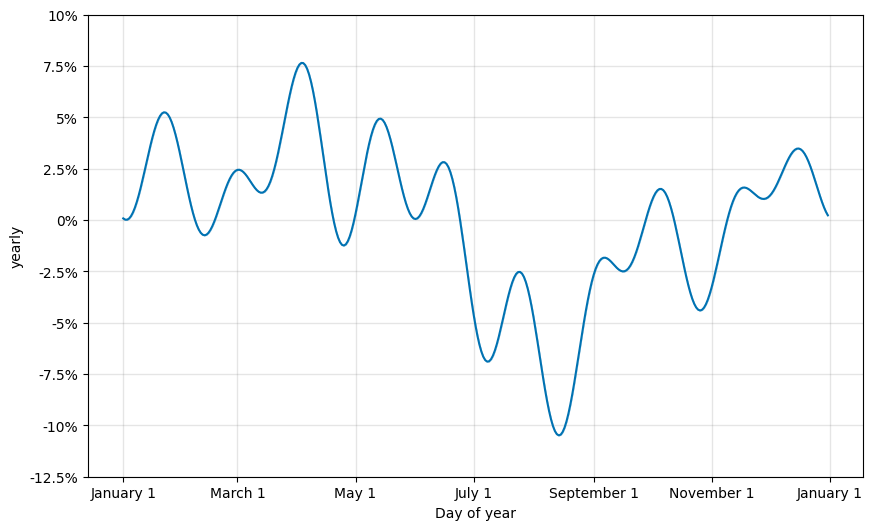

In [70]:
#extract and visualize the yearly seasonal patterns or trends that the Prophet model identified from the data.
yearly = plot_yearly(m)

Performance Evaluation

In [71]:
df_cv = cross_validation(m, initial = '1000 days', period = '30 days', horizon='30 days')

  0%|          | 0/22 [00:00<?, ?it/s]

18:56:52 - cmdstanpy - INFO - Chain [1] start processing
18:56:52 - cmdstanpy - INFO - Chain [1] done processing
  5%|▍         | 1/22 [00:00<00:18,  1.15it/s]18:56:53 - cmdstanpy - INFO - Chain [1] start processing
18:56:53 - cmdstanpy - INFO - Chain [1] done processing
  9%|▉         | 2/22 [00:01<00:18,  1.08it/s]18:56:54 - cmdstanpy - INFO - Chain [1] start processing
18:56:54 - cmdstanpy - INFO - Chain [1] done processing
 14%|█▎        | 3/22 [00:02<00:14,  1.27it/s]18:56:54 - cmdstanpy - INFO - Chain [1] start processing
18:56:54 - cmdstanpy - INFO - Chain [1] done processing
 18%|█▊        | 4/22 [00:03<00:12,  1.45it/s]18:56:55 - cmdstanpy - INFO - Chain [1] start processing
18:56:55 - cmdstanpy - INFO - Chain [1] done processing
 23%|██▎       | 5/22 [00:04<00:14,  1.17it/s]18:56:56 - cmdstanpy - INFO - Chain [1] start processing
18:56:56 - cmdstanpy - INFO - Chain [1] done processing
 27%|██▋       | 6/22 [00:04<00:12,  1.26it/s]18:56:57 - cmdstanpy - INFO - Chain [1] start 

In [72]:
df_p1 = performance_metrics(df_cv)
df_p1

,horizon,mse,rmse,mae,mdape,smape,coverage
0,3 days,38462.074305,196.117501,145.429625,0.133828,0.217051,0.769231
1,4 days,37492.767226,193.630491,139.038377,0.129642,0.209600,0.773427
2,5 days,32183.012160,179.396243,127.210376,0.113128,0.195258,0.818182
3,6 days,29694.655355,172.321372,121.835288,0.100138,0.183346,0.788112
4,7 days,28549.845812,168.966996,119.609418,0.100750,0.184925,0.815385
5,8 days,33256.474471,182.363578,127.937672,0.106076,0.230052,0.800000
6,9 days,34610.054166,186.037776,132.576733,0.110910,0.237705,0.800000
7,10 days,38001.333450,194.939307,139.926497,0.117037,0.244319,0.756643
8,11 days,33911.251645,184.150079,135.284230,0.127748,0.208619,0.773427
9,12 days,35003.093872,187.091138,135.198395,0.126716,0.210584,0.788811


In [73]:
df_p1.dtypes

horizon     timedelta64[ns]
mse                 float64
rmse                float64
mae                 float64
mdape               float64
smape               float64
coverage            float64
dtype: object

In [74]:
df_p1['horizon'] = df_p1['horizon'].astype(str)

In [75]:
df_p1.head()

,horizon,mse,rmse,mae,mdape,smape,coverage
0,3 days,38462.074305,196.117501,145.429625,0.133828,0.217051,0.769231
1,4 days,37492.767226,193.630491,139.038377,0.129642,0.209600,0.773427
2,5 days,32183.012160,179.396243,127.210376,0.113128,0.195258,0.818182
3,6 days,29694.655355,172.321372,121.835288,0.100138,0.183346,0.788112
4,7 days,28549.845812,168.966996,119.609418,0.100750,0.184925,0.815385


In [76]:
RMSE of 196 would mean, on average, the model's predictions are off by approximately 196 units of sales.

SyntaxError: unterminated string literal (detected at line 1) (1190928887.py, line 1)

In [ ]:
sMAPE indicates the average percentage deviation between predicted and actual sales. For instance, if the sMAPE for a specific horizon is 0.22, it means, on average, the model's predictions deviate by 22% from the actual sales for that particular time horizon.

In [ ]:
mean_rmse = df_p1['rmse'].mean()

In [ ]:
mean_rmse

182.00139897201507

In [ ]:
mean_smpae = df_p1['smape'].mean()

In [ ]:
mean_smpae

0.20266302363716868

In [ ]:
mean_mdape = df_p1['mdape'].mean()
mean_mdape

0.1126508620013821

In [ ]:
mean_coverage = df_p1['coverage'].mean()
mean_coverage

0.7804195804195804

In [ ]:
df_p1.columns

Index(['horizon', 'mse', 'rmse', 'mae', 'mdape', 'smape', 'coverage'], dtype='object')

In [ ]:
fig = px.bar(df_p1, x='horizon', y='rmse', labels={'horizon': 'Horizon', 'rmse': 'RMSE'}, title='RMSE by Horizon')

# Show the chart
fig.show()

In [ ]:
# Extract actual and predicted values for comparison
actual_values = df['y'].values
predicted_values = forecast['yhat'].values[:len(actual_values)]  # Take predictions for the same period as predicted values

In [ ]:
selected_month = '2027-01'

# Filter the data for the selected month
selected_month_data = df[df['ds'].dt.to_period('M') == selected_month]

# Get the indices of the selected month in the DataFrame
start_index = selected_month_data.index[0]
end_index = selected_month_data.index[-1]

# Create a line chart using Plotly to show actual vs predicted values for the selected month
fig = go.Figure()

# Add trace for actual values
fig.add_trace(go.Scatter(x=selected_month_data['ds'], y=actual_values[start_index:end_index + 1], mode='lines', name='Actual'))

# Add trace for predicted values
fig.add_trace(go.Scatter(x=selected_month_data['ds'], y=predicted_values[start_index:end_index + 1], mode='lines', name='Predicted'))

# Update layout and display the chart
fig.update_layout(title=f'Actual vs Predicted Values for {selected_month}', xaxis_title='Date', yaxis_title='Value')
fig.show()